# Fast track to GRASS & Python in Jupyter Notebooks

Python, a widely used general-purpose, high-level programming language provides a powerful scripting interface for geospatial data processing. Being easy-to-use yet powerful, it enables users to efficiently exploit the capabilities of the GRASS GIS software. Python scripts for GRASS GIS can be written at high level (GRASS GIS modules) as well as at low level (GRASS GIS libraries) through dedicated interfaces. Indeed, GRASS GIS is distributed with a set of [python packages](https://grass.osgeo.org/grass-stable/manuals/libpython/index.html) to provide functionalities at different levels.

In this tutorial, we willl focus on two of such packages: [`grass.script`](https://grass.osgeo.org/grass-stable/manuals/libpython/script_intro.html) and [`grass.jupyter`](https://grass.osgeo.org/grass-stable/manuals/libpython/grass.jupyter.html), which provide Python interface to launch GRASS GIS modules in scripts and offer classes and setup functions for running GRASS GIS in Jupyter Notebooks, respectively. We will exemplify two different use cases: 
- A. You are mostly a Python user and only need to run some GRASS GIS module on your spatial data to get a specific output
- B. You are mostly a GRASS GIS user that wants to use GRASS GIS from a Python environment or combine GRASS GIS with other Python packages.

Let's first go through the main functions of GRASS GIS Python packages.

### Python package `grass.script`

The **grass.script** package or GRASS GIS Python Scripting Library provides functions for calling GRASS GIS modules within Python scripts. The most commonly used functions include:

- `run_command`: used when the output of the modules is a raster or vector, no text type output is expected
- `read_command`: used when the output of the modules is of text type
- `parse_command`: used with modules whose output can be converted to `key=value` pairs
- `write_command`: used with modules that expect text input, either in the form of a file or from stdin

There are several wrapper functions for frequently used modules, too. For example:

- To get info from a raster, script.raster.raster_info() is used: `gs.raster_info('dsm')`
- To get info of a vector, script.vector.vector_info() is used: `gs.vector_info('roads')`
- To list the raster in a location, script.core.list_grouped() is used: `gs.list_grouped(type=['raster'])`
- To obtain the computational region, script.core.region() is used: `gs.region()`

The grass.script package also comes with different functions that are useful when you are writing your own GRASS GIS modules or converting your scripts or workflows into GRASS GIS modules. Some examples of these functions are: `append_uuid`, `use_temp_region`, `del_temp_region`, `parse_key_val`, etc. 

<div class="alert alert-info">Visit the grass.script documentation for more details and examples: <a href="https://grass.osgeo.org/grass-stable/manuals/libpython/script_intro.html">https://grass.osgeo.org/grass-stable/manuals/libpython/script_intro.html</a>

### Python package `grass.jupyter`

The **grass.jupyter** library improves the integration of GRASS and Jupyter, and provides different classes to facilitate GRASS maps visualization:

- `Map`: 2D rendering
- `Map3D`: 3D rendering
- `InteractiveMap`: interactive map visualization with folium
- `SeriesMap`: visualizations for a series of raster or vector maps
- `TimeSeriesMap`: visualization for space-time datasets

<div class="alert alert-info">Visit the grass.jupyter documentation for more details and examples:: <a href="https://grass.osgeo.org/grass-stable/manuals/libpython/grass.jupyter.html">https://grass.osgeo.org/grass-stable/manuals/libpython/grass.jupyter.html</a>

## Let's get started! 

#### Setup
This tutorial can be run locally. You need to have **GRASS GIS 8.4+** and **Jupyter** installed. For part A, please download these [Sentinel-2 images]() and move the unzipped download into the directory where you are running this notebook. For part B, we asume that you have downloaded the [North Carolina sample dataset](https://grass.osgeo.org/sampledata/north_carolina/nc_basic_spm_grass7.zip), i.e., there's an existing GRASS project. Be sure you also have the following Python libraries installed in your environment: folium, numpy, seaborn, matplotlib and pandas.

The first thing we need to do for any of the cases we'll see further on, is to **import GRASS GIS python packages**. In order to do so, we need to **add GRASS GIS python package to PATH**. Let's see how we do that.

In [2]:
# import standard Python packages
import os
import sys
import subprocess
from pathlib import Path

In [3]:
# check where GRASS GIS python packages are and add them to PATH
sys.path.append(
    subprocess.check_output(["grass-dev", "--config", "python_path"], text=True).strip()
)

In [4]:
# import GRASS GIS python packages
import grass.script as gs
import grass.jupyter as gj

### A. Use GRASS GIS tools within your Python spatial workflows

Now, let's assume you have some raster data you want to process with GRASS GIS tools, eg. Sentinel 2 satellite data, to obtain texture indices. The first thing you'll need to do is to **create a GRASS GIS project** to import your data. As we saw already in a previous *fast track* tutorial, GRASS projects are folders where we store spatial data with the same spatial reference. These projects can be placed wherever you want, including a temporary directory if you are mostly interested in the outputs only. 

So, let's *create a project in a temporary directory* to import, i.e. read, our data with GRASS GIS. The `gs.create_project()` function allows us to create a GRASS project passing different information. For example, we can use the EPSG code of the data CRS or directly pass a georeferenced file. 

In [4]:
# create a temporary folder where to place our GRASS project
import tempfile
tempdir = tempfile.TemporaryDirectory()

In [5]:
# create a project in the temporary directory
gs.create_project(path=tempdir.name, name="nc_sentinel", epsg="32617", overwrite=True)

Alternatively, use a georeferenced file to read the spatial reference information from: 

In [ ]:
# gs.create_project(path=tempdir.name, name="nc_sentinel", filename="path/to/georef/file", overwrite=True)

Any of the commands above will create a GRASS project within your working directory, i.e., where you are running the notebook in this case. If you want to create the project somewhere else, you need to use the *path* parameter.

Now that we created a project, let's **start a GRASS GIS** session there. 

In [7]:
# start GRASS in the recently created project
session = gj.init(Path(tempdir.name,"nc_sentinel"))

We are now ready to **import data** into the recently created project. Let's use a for loop to import all 10 m resolution bands. These are level 2A surface reflectance data for blue, green, red and near infrared Sentinel 2 bands.

In [8]:
files = sorted(Path('./nc_sentinel_utm17n/S2A_MSIL2A_20220304T160151_N0400_R097_T17SQV_20220304T215812.SAFE/GRANULE/L2A_T17SQV_A034986_20220304T160221/IMG_DATA/R10m').glob('*B*.jp2'))
files

[PosixPath('nc_sentinel_utm17n/S2A_MSIL2A_20220304T160151_N0400_R097_T17SQV_20220304T215812.SAFE/GRANULE/L2A_T17SQV_A034986_20220304T160221/IMG_DATA/R10m/T17SQV_20220304T160151_B02_10m.jp2'),
 PosixPath('nc_sentinel_utm17n/S2A_MSIL2A_20220304T160151_N0400_R097_T17SQV_20220304T215812.SAFE/GRANULE/L2A_T17SQV_A034986_20220304T160221/IMG_DATA/R10m/T17SQV_20220304T160151_B03_10m.jp2'),
 PosixPath('nc_sentinel_utm17n/S2A_MSIL2A_20220304T160151_N0400_R097_T17SQV_20220304T215812.SAFE/GRANULE/L2A_T17SQV_A034986_20220304T160221/IMG_DATA/R10m/T17SQV_20220304T160151_B04_10m.jp2'),
 PosixPath('nc_sentinel_utm17n/S2A_MSIL2A_20220304T160151_N0400_R097_T17SQV_20220304T215812.SAFE/GRANULE/L2A_T17SQV_A034986_20220304T160221/IMG_DATA/R10m/T17SQV_20220304T160151_B08_10m.jp2')]

In [9]:
for file in files:
    name = str(file)[-11:-4]
    print("importing " + name)
    gs.run_command("r.import", input=file, output=name)

importing B02_10m
importing B03_10m
importing B04_10m
importing B08_10m


Let's check the files we just imported are there:

In [10]:
gs.list_grouped(type="raster")["PERMANENT"]

['B02_10m', 'B03_10m', 'B04_10m', 'B08_10m']

Let's have a quick look to one of the imported bands. We can use the `InteractiveMap` class from the grass.jupyter package to **visualize**. 


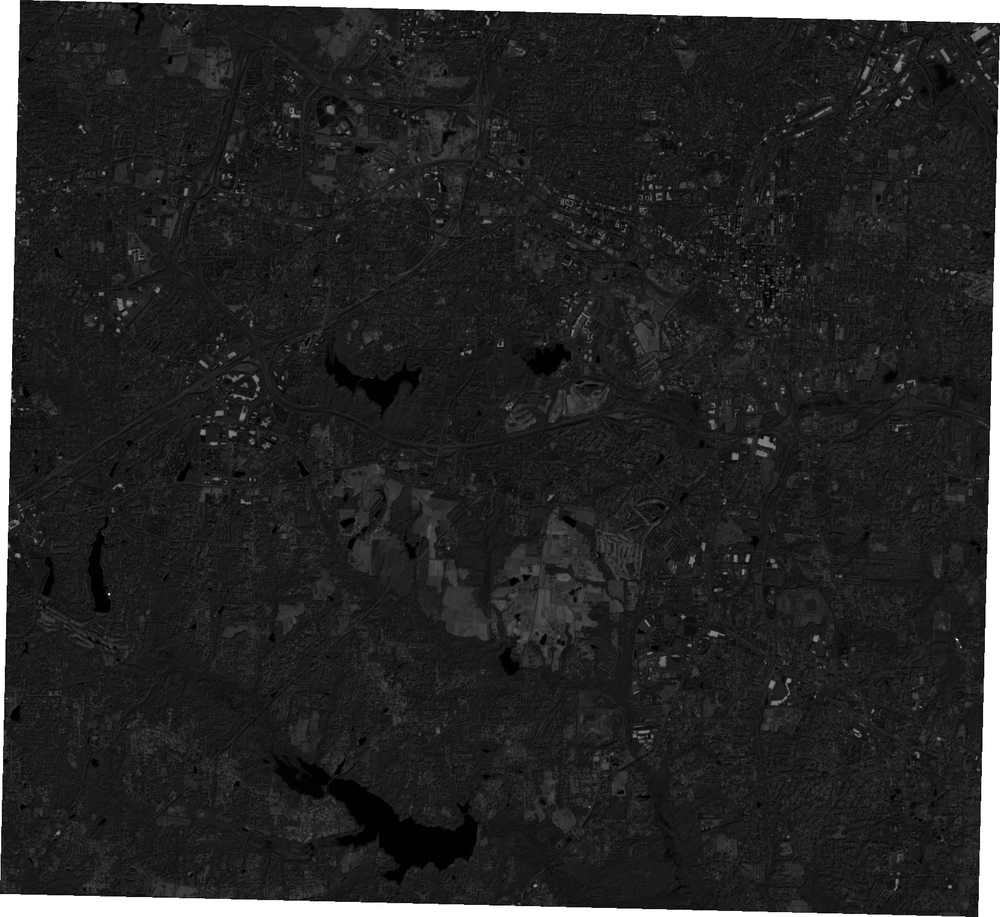

In [11]:
m = gj.InteractiveMap(width="500", tiles="OpenStreetMap")
m.add_raster("B08_10m")
m.add_layer_control()
m.show()

Next step would be to do some **processing or analysis** with the imported data. It is somehow common to estimate texture measures over pancromatic bands. Since we do not have one in Sentinel 2 data, we'll create a synthetic one by averaging blue, green and red bands. Since, we'll be creating new raster maps, we first need to set our computational region to the extent and resolution of one of our imported bands, and while there we'll remove the sawed edges from our maps. 

In [12]:
# set computational region
gs.run_command("g.region", raster="B08_10m", grow=-40, flags="p")

projection: 1 (UTM)
zone:       17
datum:      wgs84
ellipsoid:  wgs84
north:      3965860
south:      3951520
west:       700940
east:       716780
nsres:      10
ewres:      10
rows:       1434
cols:       1584
cells:      2271456



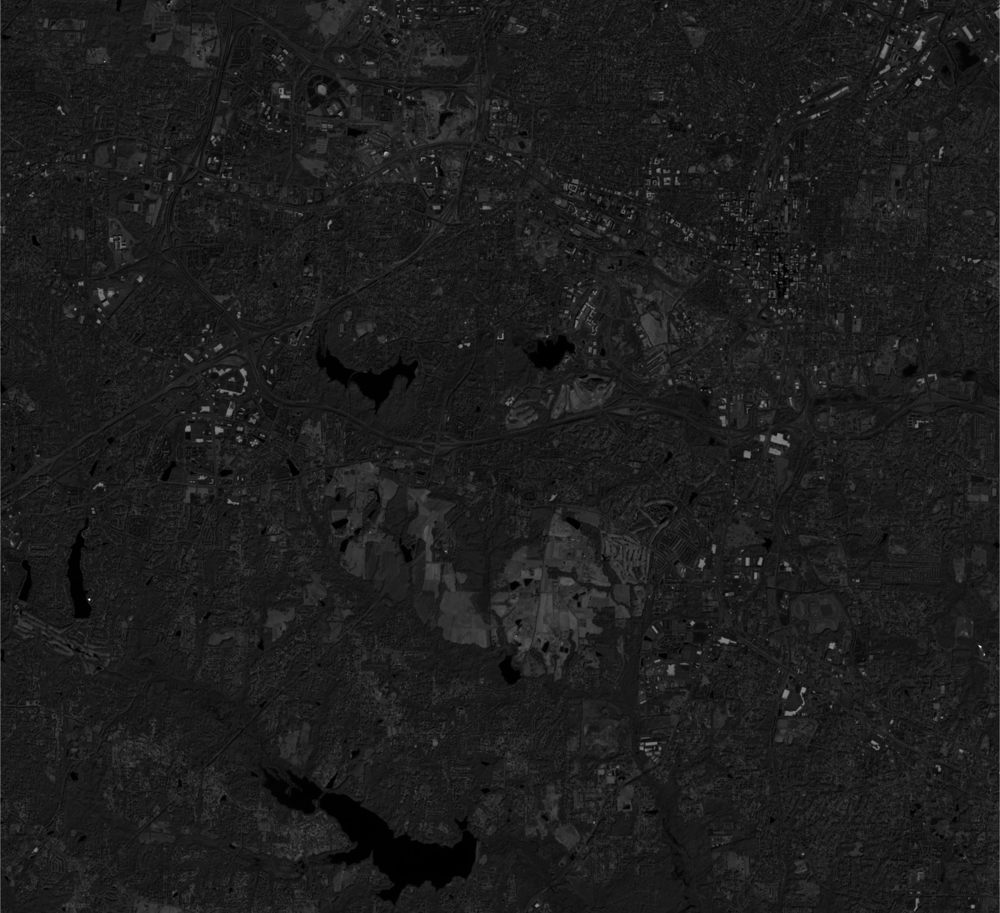

In [13]:
m = gj.InteractiveMap(width="500", tiles="OpenStreetMap", use_region=True)
m.add_raster("B08_10m")
m.add_layer_control()
m.show()

In [14]:
# create synthetic pan band
gs.mapcalc(exp="pan = (B02_10m + B03_10m + B04_10m) / 3")

Now that we have the synthetic pan band, let's estimate some texture measures with the [r.texture](https://grass.osgeo.org/grass-stable/manuals/r.texture.html) tool.

In [15]:
gs.run_command("r.texture", input="pan", output="pan", size=5, method="contrast,corr")

In [16]:
gs.list_grouped(type="raster", pattern="pan*")

{'PERMANENT': ['pan', 'pan_Contr', 'pan_Corr']}


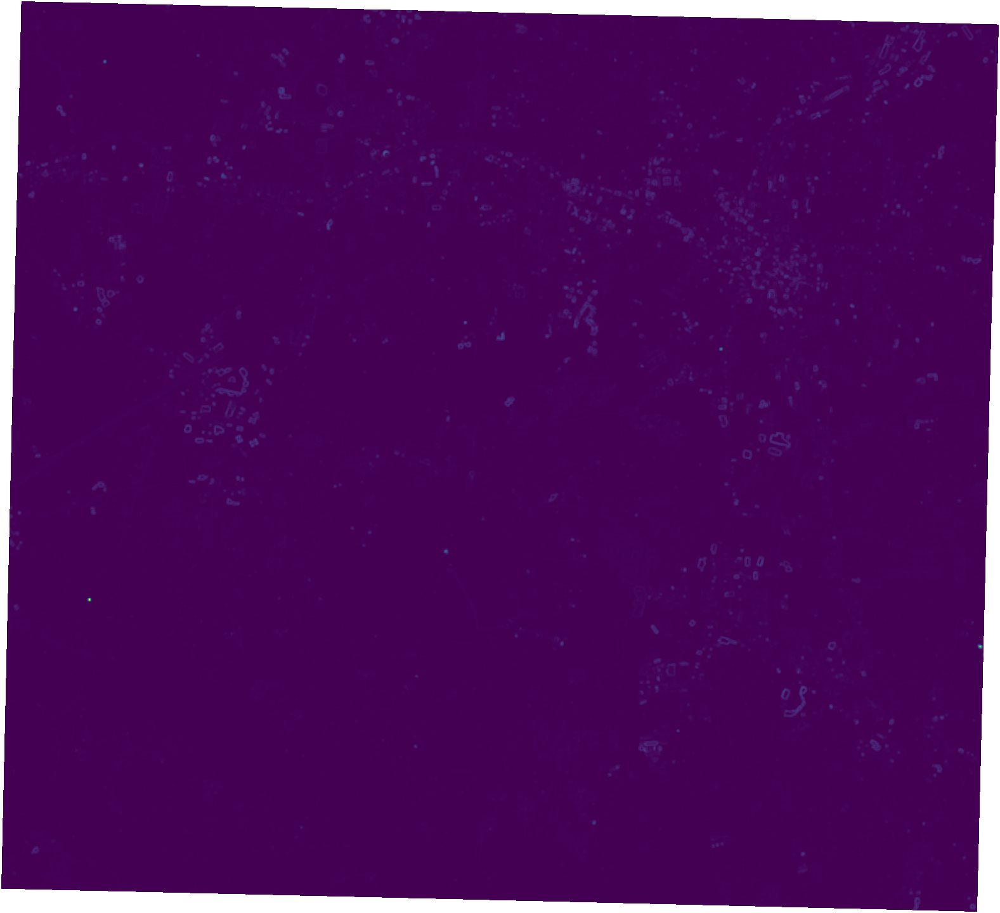
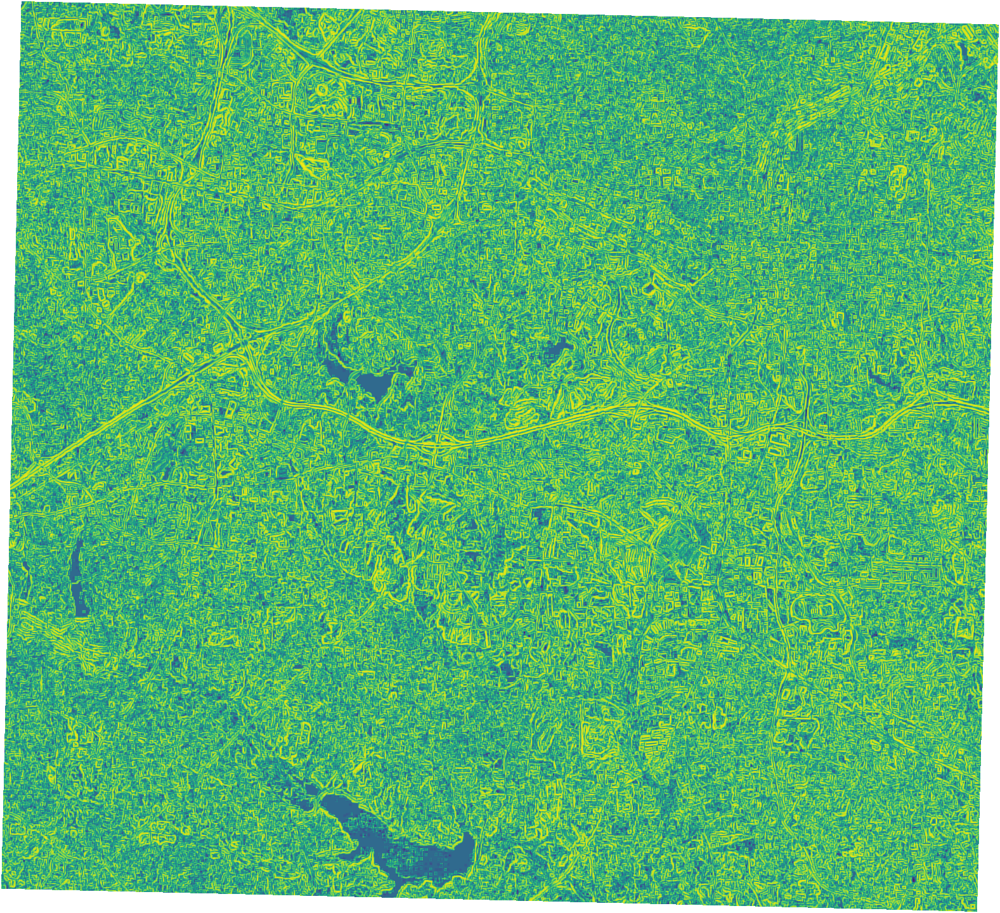

In [17]:
t = gj.InteractiveMap(width="500", tiles="OpenStreetMap", use_region=True)
t.add_raster("pan_Contr")
t.add_raster("pan_Corr")
t.add_layer_control()
t.show()

Finally, we can **export** our texture maps out of GRASS GIS and use them somewhere else or load them into a webGIS.

In [18]:
texture_maps = gs.list_grouped(type="raster", pattern="pan_*")["PERMANENT"]
texture_maps

['pan_Contr', 'pan_Corr']

In [19]:
for i in texture_maps:
    gs.run_command("r.out.gdal", input=i, output=f"{i}.tif", format="GTiff")

As you might see this use case somehow follows/is compatible with the Extract-Transform-Load (ETL) process common in production systems. Indeed, this approach allows to include GRASS GIS tools into such workflows. These type of tasks could be automatized in scripts to be run without even starting GRASS GIS using the `--exec` tool... but that's material for a different tutorial :)

### B. Use Python tools within GRASS GIS workflows

This case is more focused towards GRASS users that want to combine GRASS GIS with other Python tools for their data processing and analysis workflows. 

Several GRASS users store most or all of their projects in a single folder, which has traditionally been called `grassdata`. When this is the case, to **start GRASS GIS in an existing project**, we also need to provide the path to such a folder. 

In [5]:
# GRASS GIS variables
homedir = os.path.expanduser('~')
grassdata = os.path.join(homedir, "grassdata")
project = "nc_basic_spm_grass7"
mapset = "PERMANENT"

In [6]:
# start GRASS
session = gj.init(grassdata, project, mapset)

We are now within a GRASS project, let's **obtain information** about it, like CRS details, region settings, list of raster and vector maps, etc.

In [24]:
# print project's CRS
gs.parse_command("g.proj", flags="g")["srid"]

'EPSG:3358'

In [25]:
# print computational region
gs.region()

{'projection': 99,
 'zone': 0,
 'n': 228500.0,
 's': 215000.0,
 'w': 630000.0,
 'e': 645000.0,
 'nsres': 10.0,
 'ewres': 10.0,
 'rows': 1350,
 'cols': 1500,
 'cells': 2025000}

In [26]:
# list raster maps
gs.list_grouped(["raster"])

{'PERMANENT': ['basins',
  'developed',
  'elevation',
  'elevation_shade',
  'geology',
  'lakes',
  'landuse',
  'result_from_R',
  'soils']}

Let's obtain metadata about the *elevation* raster map. 

In [28]:
# raster info
gs.raster_info("elevation")

{'north': 228500.0,
 'south': 215000.0,
 'east': 645000.0,
 'west': 630000.0,
 'nsres': 10.0,
 'ewres': 10.0,
 'rows': '1350',
 'cols': '1500',
 'cells': '2025000',
 'datatype': 'FCELL',
 'ncats': '255',
 'min': 55.57879,
 'max': 156.3299,
 'map': 'elevation',
 'maptype': 'raster',
 'mapset': 'PERMANENT',
 'location': 'nc_basic_spm_grass7',
 'project': 'nc_basic_spm_grass7',
 'database': '/home/vandreo/grassdata',
 'date': '"Tue Nov  7 01:09:51 2006"',
 'creator': '"helena"',
 'title': '"South-West Wake county: Elevation NED 10m"',
 'timestamp': '"none"',
 'units': '"none"',
 'vdatum': '"none"',
 'semantic_label': '"none"',
 'source1': '""',
 'source2': '""',
 'description': '"generated by r.proj"',
 'comments': '"r.proj input="ned03arcsec" location="northcarolina_latlong" mapset="\\helena" output="elev_ned10m" method="cubic" resolution=10"'}

If we would only need to know or use the minimum value of the *elevation* raster, we can get it as follows:

In [29]:
gs.raster_info("elevation")["min"]

55.57879

Let's now **visualize** raster and vector maps with a different `grass.jupyter` class, the non-interactive `Map` class. This class creates and displays GRASS maps as PNG files. We basically instantiate the class first, add maps and maps' elements and finally show the result. There are 2 ways of calling display (`d.*`) modules:
- replace `.` by `_` as in `m.d_rast()`
- use `run()` as in `m.run("d.rast")`

In [12]:
# instantiate the Map class
m = gj.Map(width=400)

The *Map* class will by default use the first raster or vector extent to set the display extent. You could however also use the current computational region with `use_region=True` or call a previously saved computational region (different than the current) with the argument `saved_region`. 

In [13]:
# add maps and map elements
m.d_rast(map="elevation")
m.d_vect(map="streams")
m.d_legend(raster="elevation", at=(60, 95, 85, 90), flags="b")

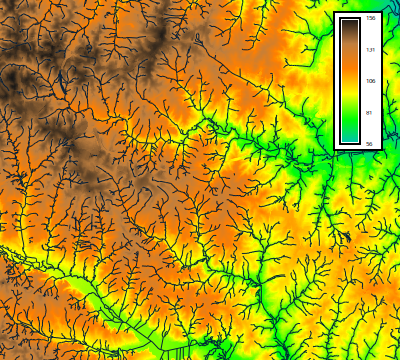

In [14]:
# disply the result
m.show()

We can save our displayed maps by calling the `save()` method, i.e., `m.save()`. For the Map class it will output a PNG file, while for the InteractiveMap class an HTML.

Let's now see how to convert our **GRASS rasters into numpy arrays**. Having our raster maps as numpy arrays opens up a world of possibilities in terms of visualization and data analysis and modelling. We won't go into anything complex here, but we'll show how to read rasters into numpy arrays, plot them, modify them and then write them back into GRASS. 

In [21]:
# import required libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from grass.script import array as garray

In [31]:
# read elevation as numpy array
elev = garray.array(mapname="elevation", null="nan")
print(elev.shape)

(1350, 1500)


In [32]:
# estimate array average
print(np.average(elev))

110.37544027560575


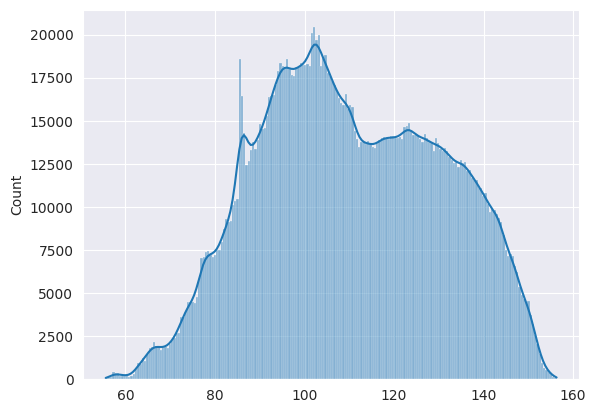

In [38]:
# plot elev histogram
sns.set_style('darkgrid')
sns.histplot(data=elev.ravel(), kde=True)
plt.show()

Let's modify our array and write it back into GRASS GIS. For this, we create a new copy of the GRASS elevation map first as shown below.

In [46]:
elev_2 = garray.array(mapname="elevation")
elev_2 *= 2

<Axes: ylabel='Count'>

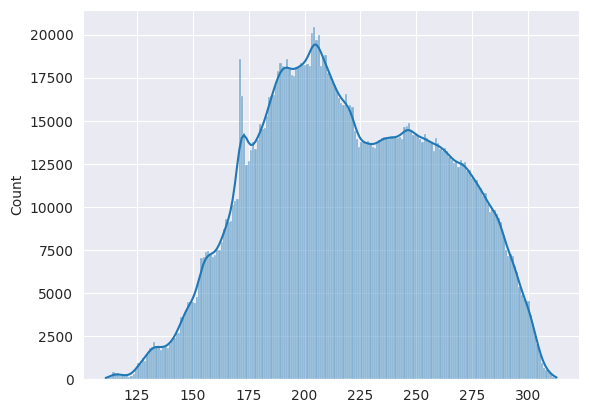

In [66]:
# plot elev*2
sns.histplot(data=elev_2.ravel(), kde=True)

Now we write the modified array into a GRASS raster map and check it's actually there.

In [48]:
elev_2.write(mapname="elevation_2", overwrite=True)

0

In [68]:
gs.list_grouped(type="raster", pattern="elev*")

{'PERMANENT': ['elevation', 'elevation_2', 'elevation_shade']}

Let's now explore how to convert text outputs into pandas data frames. We will get elevation univariate statistics for each land use class and parse the output into a pandas data frame.

In [52]:
import pandas as pd
from io import StringIO

In [70]:
stats = gs.read_command("r.univar", flags="t", map="elevation", zones="landuse", separator="pipe").strip()
df = pd.read_csv(StringIO(stats), sep="|")

df

,zone,label,non_null_cells,null_cells,min,max,range,mean,mean_of_abs,stddev,variance,coeff_var,sum,sum_abs
0,1,developed,592288,0,55.996025,156.099106,100.103081,105.556899,105.556899,21.498774,462.197284,20.367000,6.252008e+07,6.252008e+07
1,2,agriculture,17347,0,81.536209,143.130661,61.594452,116.059964,116.059964,15.604921,243.513561,13.445568,2.013292e+06,2.013292e+06
2,3,herbaceous,206129,0,61.980289,155.021896,93.041607,114.473224,114.473224,19.112106,365.272595,16.695700,2.359625e+07,2.359625e+07
3,4,shrubland,135994,0,68.985504,154.706085,85.720581,120.526722,120.526722,18.023981,324.863902,14.954345,1.639091e+07,1.639091e+07
4,5,forest,1021725,0,55.888546,156.329865,100.441319,111.692869,111.692869,19.307004,372.760411,17.285798,1.141194e+08,1.141194e+08
5,6,water,42854,0,79.522514,148.759506,69.236992,94.394427,94.394427,13.387548,179.226431,14.182561,4.045179e+06,4.045179e+06
6,7,sediment,1610,0,85.998611,144.819611,58.820999,110.847626,110.847626,20.980069,440.163288,18.926945,1.784647e+05,1.784647e+05


Next, we plot the mean elevation per class as follows:

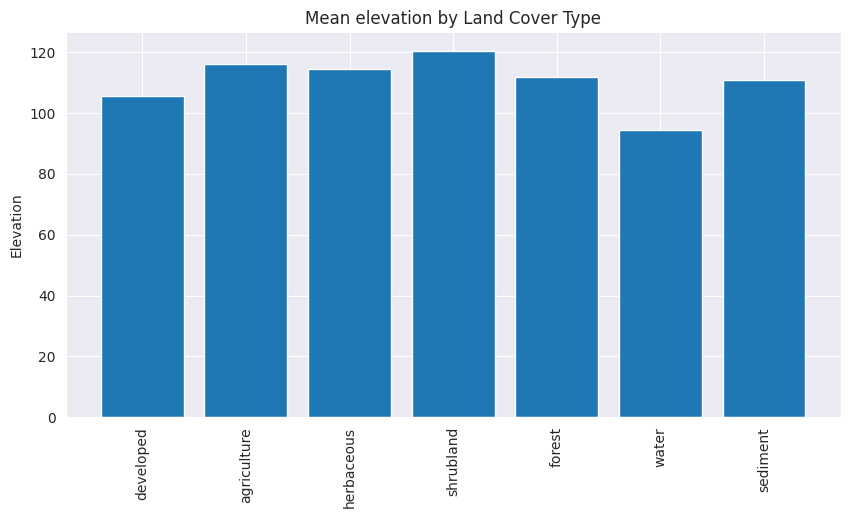

In [71]:
plt.figure(figsize=(10, 5))
plt.bar(df['label'], df['mean'])
plt.ylabel('Elevation')
plt.title('Mean elevation by Land Cover Type')
plt.xticks(rotation=90) 
plt.show()

Similarly, if we need to do analysis with the attributes of GRASS vector maps, it is also possible to read the attribute table as a pandas data frame. Let's see an example with the census vector map:

In [57]:
census = gs.read_command("v.db.select", map="census").strip()
df = pd.read_csv(StringIO(census), sep="|")

df

,cat,OBJECTID,AREA,PERIMETER,BLOCK_,BLOCK_ID,BLOCKNUM,TOTAL_POP,POP_1RACE,WHITE_ONLY,...,GQ_NONINST,FAM_SIZE,HOUSING_U,OCCUPIED,VACANT,OWNER_U,RENTER_U,VACANT_SEA,HH_SIZE_OW,HH_SIZE_RE
0,1,83117,27159.666,757.669,83118,83117,371830535013008,44,44,41,...,0,2.92,19,19,0,15,4,0,2.07,3
1,2,83119,43260.590,937.751,83120,83119,371830535013003,50,49,47,...,0,2.69,27,26,1,22,4,0,1.77,2
2,3,83120,35660.508,753.005,83121,83120,371830535013015,54,53,51,...,0,2.32,25,25,0,21,4,0,2.14,2
3,4,83123,531.869,99.484,83124,83123,371830535014005,0,0,0,...,0,0.00,0,0,0,0,0,0,0.00,0
4,5,83127,65508.453,1732.162,83128,83127,371830535013012,92,91,84,...,0,3.04,37,36,1,30,6,0,2.60,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2532,2533,149462,46021.387,897.124,149463,149462,371830528053018,0,0,0,...,0,0.00,0,0,0,0,0,0,0.00,0
2533,2534,149464,57015.102,1058.462,149465,149464,371830528053017,44,44,34,...,0,3.00,17,17,0,16,1,0,2.63,2
2534,2535,149469,26376.307,668.157,149470,149469,371830528012006,0,0,0,...,0,0.00,0,0,0,0,0,0,0.00,0
2535,2536,149472,9690.492,405.667,149473,149472,371830528012019,2,2,2,...,0,2.00,1,1,0,1,0,0,2.00,0


Once the attribute table is a data frame, we can, e.g., filter data by a condition and plot the results.

In [60]:
fam_size_3 = df[df["FAM_SIZE"] > 3.0]

<Axes: xlabel='FAM_SIZE', ylabel='OWNER_U'>

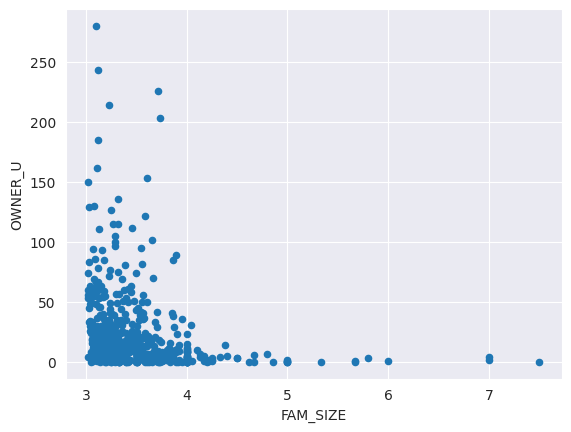

In [65]:
fam_size_3.plot.scatter(x="FAM_SIZE",y="OWNER_U")

### Final remarks

In this tutorial, we have demonstrated, with very simple examples, how to use GRASS GIS tools together with Python, putting a special focus on data import and export as well as format conversions. Expert GRASS or Python users can then implement their workflows combining tools accordingly.

Enjoy!